In [593]:
import numpy as np
import pandas as pd
import cv2
import pickle 
import os,sys
import glob
import matplotlib.pyplot as plt
%matplotlib inline 
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
from moviepy.editor import VideoFileClip

print('Done importing')

Done importing


### Camera Calibration Using Chessboard Images

In [2]:
glob.glob('camera_cal/*.jpg')

['camera_cal/calibration1.jpg',
 'camera_cal/calibration10.jpg',
 'camera_cal/calibration11.jpg',
 'camera_cal/calibration12.jpg',
 'camera_cal/calibration13.jpg',
 'camera_cal/calibration14.jpg',
 'camera_cal/calibration15.jpg',
 'camera_cal/calibration16.jpg',
 'camera_cal/calibration17.jpg',
 'camera_cal/calibration18.jpg',
 'camera_cal/calibration19.jpg',
 'camera_cal/calibration2.jpg',
 'camera_cal/calibration20.jpg',
 'camera_cal/calibration3.jpg',
 'camera_cal/calibration4.jpg',
 'camera_cal/calibration5.jpg',
 'camera_cal/calibration6.jpg',
 'camera_cal/calibration7.jpg',
 'camera_cal/calibration8.jpg',
 'camera_cal/calibration9.jpg']

In [3]:
#load the calibration data from Attemp_1.ipynb 
#Finally we will import the code from Attempt_1.ipynb

calibration_data = pickle.load(open('calibration.p','rb'))
mtx = calibration_data['mtx']
dist = calibration_data['dist']

### Load a test image

(720, 1280, 3)


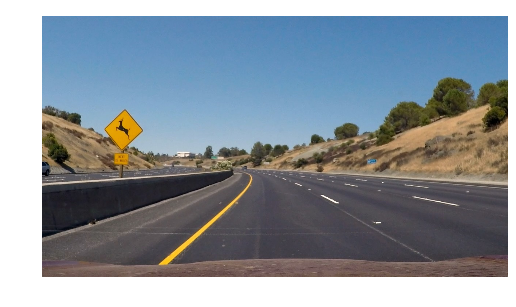

In [4]:
image = plt.imread('test_images/test2.jpg')
plt.imshow(image)
plt.axis('off')

print(image.shape)

## Utility functions goes here

In [777]:
#Load an image
def LoadImgAndCrop(pathToImg):
    #print(os.path.join(os.getcwd(),pathToImg))
    image = plt.imread(pathToImg)
    #crop
    #img = image[0:image.shape[0]-50,0:image.shape[1]]
    return image


#undistort images from camera lens distortion
def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx,dist,None,mtx)
    return undist

# Order the coordinates in the clockwise fashion starting from top left corner
# To check that the order of the src points are in right order
def order_points(pts):
    """ 
    order of the points should be clockwise, starting from top left corner (tl)
    """
    rect = np.zeros((4,2),dtype='float32')
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]    #tl
    rect[2] = pts[np.argmax(s)]    #tr
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)] #br
    rect[3] = pts[np.argmax(diff)] #bl
    check = 'tl: {},tr: {},br: {},bl:{}'.format(rect[0],rect[1],rect[2],rect[3])
    print(check)
    #return rect 

#perfom perspective transform and returns a birds eye view of the region bounded by 'src'
def PerspectiveTransform(img, src, dst):
    """
    img: is the undistorted image obtained above
    src: the source points (here the points are set clockwise from top left)
    dst: destination point
    """
    h,w = img.shape[:2]
    M = cv2.getPerspectiveTransform(src,dst)
    Minv = cv2.getPerspectiveTransform(dst,src)
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, Minv
    

## All the masking and Sobel operators will be applied on the warped image
# HLS to get the yellow line from the warped image (output of PerspectiveTransform)
def hls_select(warped_img, thresh=(0,255)):
    hls = cv2.cvtColor(warped_img,cv2.COLOR_RGB2HLS)
    s_ch = hls[:,:,2]
    binary_output = np.zeros_like(s_ch)
    binary_output[(s_ch > 20) & (s_ch <= 150)] = 1
    return binary_output

# HSV to get yellow from the warped image
def hsv_select(warped_img, thresh=(0,255)):
    hsv = cv2.cvtColor(warped_img, cv2.COLOR_BGR2HSV)
    v_ch = hsv[:,:,2]
    binary_output = np.zeros_like(v_ch)
    binary_output[(v_ch > thresh[0])&(v_ch <= thresh[1])] = 1
    return binary_output


# Would like to try histogram equalizer to get the white lane markings too
# This is just an experiment 

def get_histogram_equalized_binary(warped_img, thresh = 250):
    grayWarped = cv2.cvtColor(warped_img, cv2.COLOR_RGB2GRAY)
    histEqualizedgrayWarped = cv2.equalizeHist(grayWarped)
    binary_output = np.zeros_like(grayWarped)
    binary_output[histEqualizedgrayWarped > thresh] = 1
    return binary_output



# Applying Sobel operator
# ===============================================================

def abs_sobel_thresh(img, orient='x', thresh=(0,255),grayScaled=False):
    """img is assumed to be read in by plt.imread(). Hence is RGB
       output: a binary image (grayscaled)
    """
    if not grayScaled:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        sobel = cv2.Sobel(gray, cv2.CV_64F,orient=='x',orient=='y')
    else:
        sobel = cv2.Sobel(img, cv2.CV_64F,orient=='x',orient=='y')
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sobel_binary

def mag_sobel_thresh(img,sobel_kernel=3, thresh=(0,255),grayScaled=False):
    """img is assumed to be read in by plt.imread(). Hence is RGB
       output: a binary image (grayscaled)
    """
    if not grayScaled:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        sobelx = cv2.Sobel(gray, cv2.CV_64F,1,0,ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F,0,1,ksize=sobel_kernel)
    else:
        sobelx = cv2.Sobel(img, cv2.CV_64F,1,0,ksize = sobel_kernel)
        sobely = cv2.Sobel(img, cv2.CV_64F,0,1,ksize = sobel_kernel)
    mag_sobel = np.sqrt((sobelx)**2+(sobely)**2)
    scaled_sobel = np.uint8(255*(mag_sobel/np.max(mag_sobel)))
    sobel_binary = np.zeros_like(scaled_sobel)
    sobel_binary[(scaled_sobel > thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sobel_binary

def dir_sobel_thresh(img,sobel_kernel= 3, thresh= (0,np.pi/2),grayScaled=False):
    """img is assumed to be read in by plt.imread(). Hence is RGB
       output: a binary image (grayscaled)
    """
    if not grayScaled:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=sobel_kernel)
    else:
        sobelx = cv2.Sobel(img, cv2.CV_64F, 1,0, ksize=sobel_kernel)
        sobely = cv2.Sobel(img, cv2.CV_64F, 0,1, ksize=sobel_kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    sobel_binary = np.zeros_like(grad_dir)
    sobel_binary[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    return sobel_binary


def sobel_combine(img,
                  mag_kernel=3,
                  dir_kernel=3,
                  mag_thresh=(20,150),
                  dir_thresh=(0.5,0.9),
                  grayScaled=False):
    """
    img: a cropped, undistorted, and warped image
    out: a binary image with different Sobel opertor applied to it
    """
    img_mag_sobel = mag_sobel_thresh(img,mag_kernel,thresh=mag_thresh,grayScaled=grayScaled)
    img_dir_sobel = dir_sobel_thresh(img,dir_kernel,thresh=dir_thresh,grayScaled=grayScaled)
    img_abs_sobelx = abs_sobel_thresh(img,'x',thresh=(50,200),grayScaled=grayScaled)
    img_abs_sobely = abs_sobel_thresh(img,'y',thresh=(50,200),grayScaled=grayScaled)
    #combine
    combined = np.zeros_like(img_mag_sobel)
    combined[((img_abs_sobelx == 1) & ( img_abs_sobely == 1)) \
             | ((img_mag_sobel == 1)&(img_dir_sobel == 1))] = 1
    return combined


# ===============================================================
# def adaptiveHistogramEqualization(warped_img,clipLimit=2.0,kernel_size=(6,6)):
#     """HSV transformed warped image"""
#     clahe = cv2.createCLAHE(clipLimit=2.0,tileGridSize=(6,6))
#     #img_hsv = cv2.cvtColor(warped_img, cv2.COLOR_RGB2HSV)
#     cl1 = clahe.apply(img_hsv[:,:,2])
#     #plt.imshow(cl1,cmap='gray')
#     #plt.show()
#     binary_cl1 = np.zeros_like(cl1)
#     binary_cl1[cl1>225] = 1
#     return binary_cl1

def GaussianC_Adaptive_Threshold(img,kernel,cut_val):
    # Apply Gaussian adaptive thresholding
    img_cut = cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,kernel,cut_val)
    return img_cut


def color_mask(hsv_img,low,high):
    mask = cv2.inRange(hsv_img,low,high)
    return mask

def apply_color_mask(hsv_img,img, low,high):
    mask= color_mask(hsv_img,low,high)
    res = cv2.bitwise_and(img,img, mask=mask)
    return res


def combine_color_mask(hsv_img1,hsv_img2,low_color1,high_color1,low_color2,high_color2):
    mask_color1 = color_mask(hsv_img1,low_color1,high_color1)
    mask_color2 = color_mask(hsv_img2,low_color2,high_color2)
    combined_mask = cv2.bitwise_or(mask_color1,mask_color2)
    return combined_mask
    

def moving_average(a,n=3):
    ret = np.cumsum(a,dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n-1:]/n


#load and crop each frame before running the pipe line
#the global parameters are allready defined (ASSUMED)
def pipeline(img):
    #1. load the cropped image
    #3. undistort
    img_undistort = undistort(img, mtx,dist)
    #4. Perspective Transform to get birds eye view
    warped_img,M,Minv = PerspectiveTransform(img_undistort,src,dst)
    #5. Apply Yellow and White color masks to find yellow and white lins
    img_hsv = cv2.cvtColor(warped_img, cv2.COLOR_RGB2HSV)
    #masked_img_yellow = apply_color_mask(img_hsv,warped_img,low_yellow,high_yellow)
    #masked_img_white = apply_color_mask(img_hsv,warped_img,low_white,high_white)
    # Combine the two masks to get both the yellow and the white lines
    yellow_mask = color_mask(img_hsv,low_yellow,high_yellow)
    white_mask = color_mask(img_hsv, low_white,high_white)
    mask = cv2.bitwise_or(yellow_mask,white_mask)
    #6. Apply Sobel filters on the V channel of the HSV space
    img_v = img_hsv[:,:,2]
    img_v_abs_x = abs_sobel_thresh(img_v,orient='x',thresh=(50,255),grayScaled=True)
    img_v_abs_y = abs_sobel_thresh(img_v,orient='y',thresh=(50,255),grayScaled=True)

    img_v_mag_sobel = mag_sobel_thresh(img_v,thresh=(20,150),grayScaled=True)
    img_v_dir_sobel = dir_sobel_thresh(img_v,thresh=(0.5,1.1),grayScaled=True)

#     combined_v = np.zeros_like(img_v_mag_sobel)
#     combined_v[((img_v_abs_x == 1) & ( img_v_abs_y == 1)) \
#                 | ((img_v_mag_sobel == 1)) ] = 1
    combined_v_1 = cv2.bitwise_or(img_v_abs_x,img_v_abs_y)
    combined_v = cv2.bitwise_or(combined_v_1,img_v_mag_sobel)
    #7. Combine the two filters/masks
    #binary_color_sobel_combo = cv2.bitwise_or(mask,combined_v)
    #8. Apply Sobel filters (mag, abs_x,abs_y combo) on the S channel of the HLS space
    img_hls = cv2.cvtColor(warped_img, cv2.COLOR_RGB2HLS)
    img_s = img_hls[:,:,2]
    img_abs_x = abs_sobel_thresh(img_s,orient='x',thresh=(50,255),grayScaled=True)
    img_abs_y = abs_sobel_thresh(img_s,orient='y',thresh=(50,255),grayScaled=True)
    img_mag_sobel = mag_sobel_thresh(img_s,thresh=(20,150),grayScaled=True)
#     combined_s = np.zeros_like(img_mag_sobel)
#     combined_s[((img_abs_x == 1) & ( img_abs_y == 1)) \
#                  | ((img_mag_sobel == 1))] = 1
    combined_s_1 = cv2.bitwise_or(img_abs_x,img_abs_y)
    combined_s = cv2.bitwise_or(combined_s_1,img_mag_sobel)
    combined_ch = cv2.bitwise_or(combined_v,combined_s)
    #now combine with color masks
    binary_color_sobel_combo = cv2.bitwise_or(mask,combined_ch)
    #9. combine the output from step7 and step8.
    #final_masked_binary = cv2.bitwise_or(binary_color_sobel_combo,combined_s)
    final_masked_binary = cv2.bitwise_or(binary_color_sobel_combo,combined_ch)
    #final_masked_binary = cv2.bitwise_or(final_masked_binary,binary_histEq)
#     img_shape = img.shape
#     mov_window_size = np.int(img_shape[1]/50)
#     meanVal = np.mean(final_masked_binary,axis=0)
#     meanVal = moving_average(meanVal, n=mov_window_size)
#     if np.mean(meanVal) > 15:
# #     #10. incase the lighting is very bright, final_masked_binary will have unnecessary white pixel
# #     # so remove those by bitwize_and() with hsv_v channel    
#         bin_output_v = np.zeros_like(img_v)
#         bin_output_v[(img_v > 225)] = 1
#         final_masked_binary = cv2.bitwise_and(final_masked_binary,bin_output_v)
#         #final_masked_binary = cv2.bitwise_or(final_masked_binary,binary_histEq)
#     #10. return this combined binary to plot
    return final_masked_binary, Minv

def adaptiveHistogram(img_one_ch):
    clahe = cv2.createCLAHE(clipLimit=7.0,tileGridSize=(10,10))
    cl1 = clahe.apply(img_one_ch)
    return cl1


def pipeline2(img):
    img_undistort = undistort(img,mtx,dist)
    warped_img,M,Minv = PerspectiveTransform(img_undistort,src,dst)
    img_hsv = cv2.cvtColor(warped_img, cv2.COLOR_RGB2HSV)
    yellow_mask = color_mask(img_hsv,low_yellow,high_yellow)
    white_mask = color_mask(img_hsv, low_white,high_white)
    #mask = cv2.bitwise_or(yellow_mask,white_mask)
    binary_yellow_mask=np.zeros_like(yellow_mask)
    binary_yellow_mask[yellow_mask>0]=1
    binary_white_mask=np.zeros_like(white_mask)
    binary_white_mask[white_mask>0]=1
    mask = cv2.bitwise_or(binary_yellow_mask,binary_white_mask)

    img_v = img_hsv[:,:,2]
    img_v = adaptiveHistogram(img_v)


    binary_cl1 = np.zeros_like(img_v)
    binary_cl1[img_v>225] = 1

    binary_output = np.zeros_like(mask)
    binary_output[(mask==1)&(binary_cl1==1)] = 1  
    
    binary_output[:,:100] = 0
    binary_output[:,400:900] = 0
    binary_output[:,1200:] = 0
    return binary_output,Minv


def pipeline3(img):
    img_undistort = undistort(img, mtx, dist)
    warped_img,M,Minv = PerspectiveTransform(img_undistort,src,dst)
    
    img_hsv = cv2.cvtColor(warped_img, cv2.COLOR_RGB2HSV)
    yellow_mask = color_mask(img_hsv,low_yellow,high_yellow)
    white_mask = color_mask(img_hsv, low_white,high_white)
    mask = cv2.bitwise_or(yellow_mask,white_mask)
    
    img_hls = cv2.cvtColor(warped_img, cv2.COLOR_RGB2HLS)
    img_s = img_hls[:,:,2]
    mag_s = mag_sobel_thresh(img_s,thresh=(20,150),grayScaled=True)
    
    combined_fin = cv2.bitwise_and(mask,mag_s)
    combined_fin[:,:100] = 0
    combined_fin[:,400:900]=0
    combined_fin[:,1200:] = 0
    
    return combined_fin, Minv
    
def getHistogram(singleCh_img):
    histogram = np.sum(singleCh_img,axis=0)
    return histogram
## Preliminary Visualize

def plot_two_imgs(img1,img2,img1_title,img2_title):
    f, (ax1,ax2) = plt.subplots(1,2,figsize=(24,10))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(img1_title,fontsize=20)
    ax2.imshow(img2)
    ax2.set_title(img2_title, fontsize=20)

### Load an image and Display original vs Cropped Image

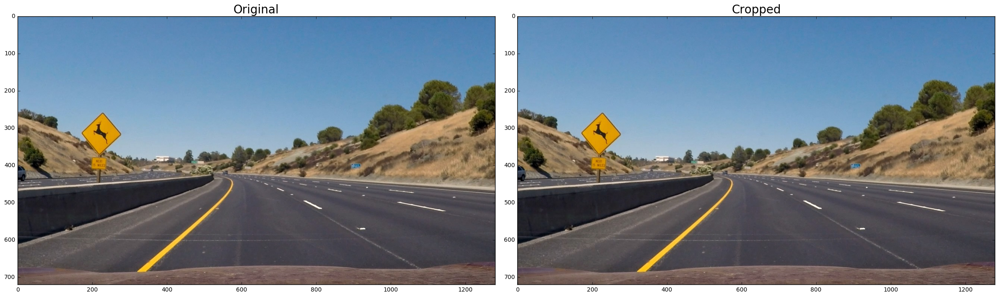

In [603]:
img = LoadImgAndCrop('test_images/test2.jpg')

plot_two_imgs(plt.imread('test_images/test2.jpg'),img,'Original','Cropped')


### Undistort the above Loaded and Cropped Image

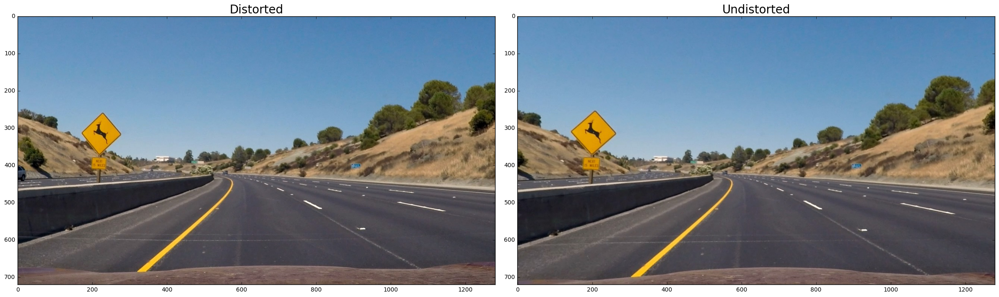

In [604]:
#load the calibration data from Attemp_1.ipynb 

calibration_data = pickle.load(open('calibration.p','rb'))
mtx = calibration_data['mtx']    # calibration matrix
dist = calibration_data['dist']  # distortion coefficient
img_undistort = undistort(img, mtx,dist)

plot_two_imgs(img,img_undistort,'Distorted','Undistorted')

Note above that the right hand image is flattened if we pay attention to the both side of the images. Left image, which is distorted, more is visible than the right side image above.

### Apply Perspective Transform to get a birds eye view of the lanes in front

In [605]:
img_shape = img_undistort.shape

In [606]:
# set up reference points for transformation
y_low = np.uint((img_shape[0]-50)*0.75)
y_high = np.uint(img_shape[0]-50)

Offset = np.uint(img_shape[1]//2)
tl_x = np.int(0.75*Offset)
tr_x = np.int(1.35*Offset)
bl_x = np.int(0.1*Offset)
br_x = np.int(1.9*Offset)

# points on the image to be transformed
src = np.float32([[tl_x,y_low],[tr_x,y_low],
                  [br_x,y_high],[bl_x,y_high]])

# points to which transformation takes place
dst = np.float32([[0,0],[img_shape[1],0],[img_shape[1],img_shape[0]]
                  ,[0,img_shape[0]]])

pts = 'tl:({},{})\n tr:({},{})\n br:({},{})\n bl:({},{})'
print(pts.format(tl_x,y_low,tr_x,y_low,br_x,y_high,bl_x,y_high))

tl:(480,502)
 tr:(864,502)
 br:(1216,670)
 bl:(64,670)


In [607]:
# use perspective transform now

warped_img,M,Minv = PerspectiveTransform(img_undistort,src,dst)

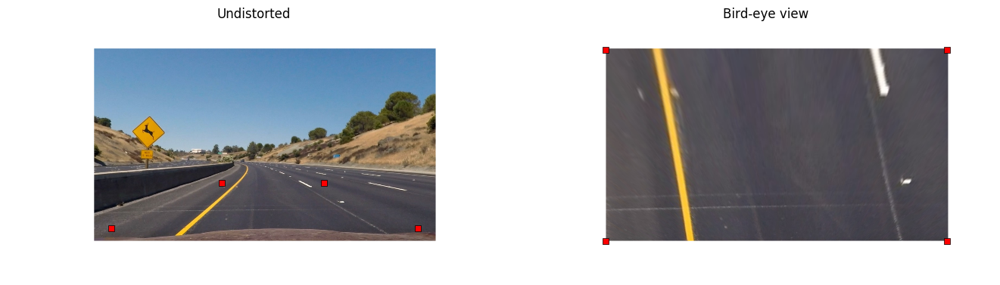

In [608]:
#Visualize
plt.figure(figsize=(16,10))
plt.subplot(1,2,1)
plt.imshow(img_undistort,cmap='gray')
for i in range(4):
    plt.plot(src[i][0],src[i][1],'rs')
plt.title('Undistorted')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(warped_img,cmap='gray')
for i in range(4):
    plt.plot(dst[i][0],dst[i][1],'rs')
    
plt.title('Bird-eye view')
plt.axis('off');

### Color Masking on HSV color space

#### Yellow Color

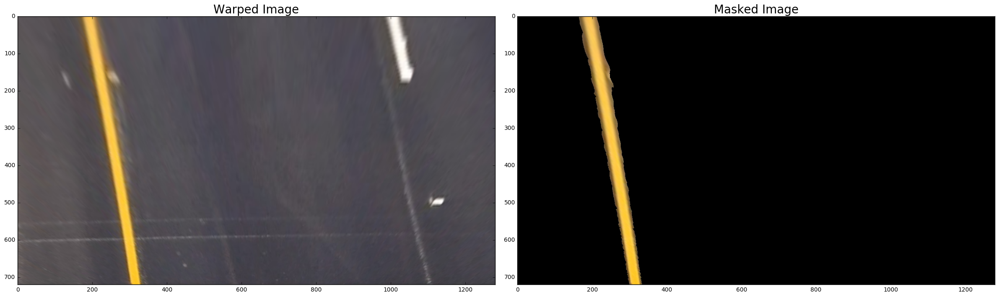

In [609]:
# Use the HSV color space isolate the yellow line from the warped image

img_hsv = cv2.cvtColor(warped_img, cv2.COLOR_RGB2HSV)

low_yellow = np.array([0,100,100])
high_yellow = np.array([60,255,255])

masked_img_yellow = apply_color_mask(img_hsv,warped_img,low_yellow,high_yellow)

plot_two_imgs(warped_img,masked_img_yellow,'Warped Image','Masked Image')

#### White Color

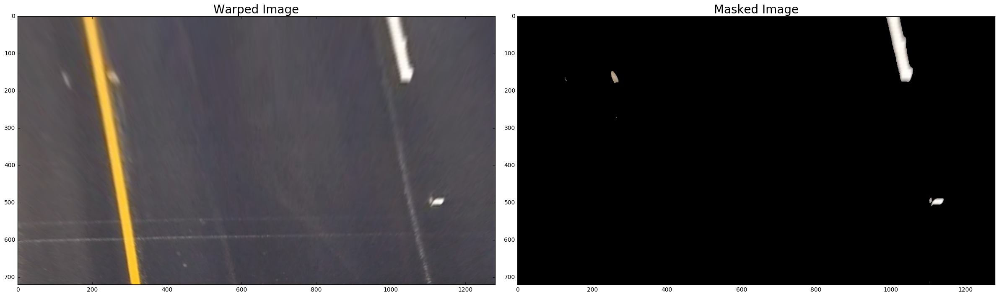

In [610]:
# Use the HSV color space isolate the white line from the warped image

img_hsv = cv2.cvtColor(warped_img, cv2.COLOR_RGB2HSV)

low_white = np.array([0,0,140])
high_white = np.array([255,80,255])

masked_img_white = apply_color_mask(img_hsv,warped_img,low_white,high_white)


plot_two_imgs(warped_img,masked_img_white, 'Warped Image','Masked Image')

#### Combine the Yellow and White Color Masks

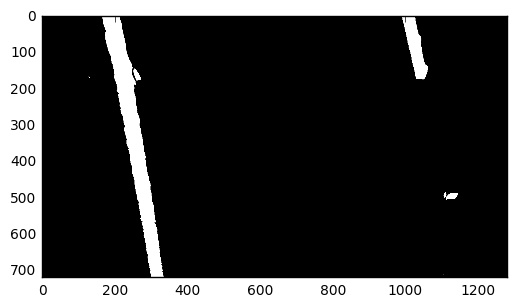

In [611]:
# Combine the two masks to get both the yellow and the white lines
yellow_mask = color_mask(img_hsv,low_yellow,high_yellow)
white_mask = color_mask(img_hsv, low_white,high_white)
mask = cv2.bitwise_or(yellow_mask,white_mask)

plt.imshow(mask,cmap='gray')
#plt.axis('off')

### Apply Sobel Filters on the V channel in the HSV space

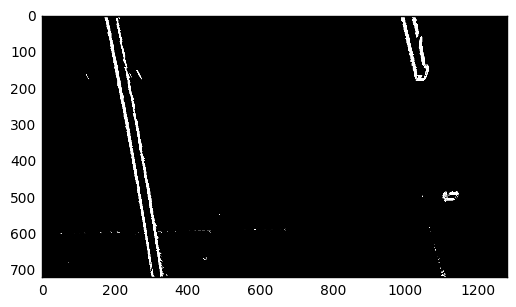

In [615]:
img_v = img_hsv[:,:,2]
img_v_abs_x = abs_sobel_thresh(img_v,orient='x',thresh=(50,255),grayScaled=True)
img_v_abs_y = abs_sobel_thresh(img_v,orient='y',thresh=(50,255),grayScaled=True)

img_v_mag_sobel = mag_sobel_thresh(img_v,thresh=(20,150),grayScaled=True)
img_v_dir_sobel = dir_sobel_thresh(img_v,thresh=(0.5,1.1),grayScaled=True)

img_v_comb_abs = cv2.bitwise_or(img_v_abs_x,img_v_abs_y)

# plt.imshow(img_v_comb_abs, cmap='gray')
# plt.show()
plt.imshow(cv2.bitwise_and(img_v_comb_abs,img_v_mag_sobel),cmap='gray')

# combined_v = np.zeros_like(img_v_mag_sobel)
# combined_v[((img_v_abs_x == 1) & ( img_v_abs_y == 1)) \
#             | ((img_v_mag_sobel == 1) ) ] = 1

# plt.imshow(combined_v, cmap='gray')

### Apply the Sobel Filters on the S channel in the HLS color space

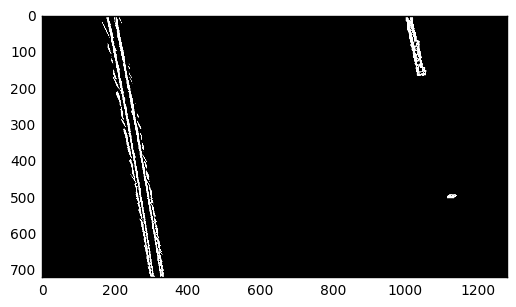

In [616]:
img_hls = cv2.cvtColor(warped_img, cv2.COLOR_RGB2HLS)
img_s = img_hls[:,:,2]
img_abs_x = abs_sobel_thresh(img_s,orient='x',thresh=(50,255),grayScaled=True)
img_abs_y = abs_sobel_thresh(img_s,orient='y',thresh=(50,255),grayScaled=True)
img_mag_sobel = mag_sobel_thresh(img_s,thresh=(20,150),grayScaled=True)
#     combined_s = np.zeros_like(img_mag_sobel)
#     combined_s[((img_abs_x == 1) & ( img_abs_y == 1)) \
#                  | ((img_mag_sobel == 1))] = 1
combined_s_1 = cv2.bitwise_or(img_abs_x,img_abs_y)
combined_s = cv2.bitwise_or(combined_s_1,img_mag_sobel)

plt.imshow(combined_s,cmap='gray')

### Apply the pipeline to the test images 


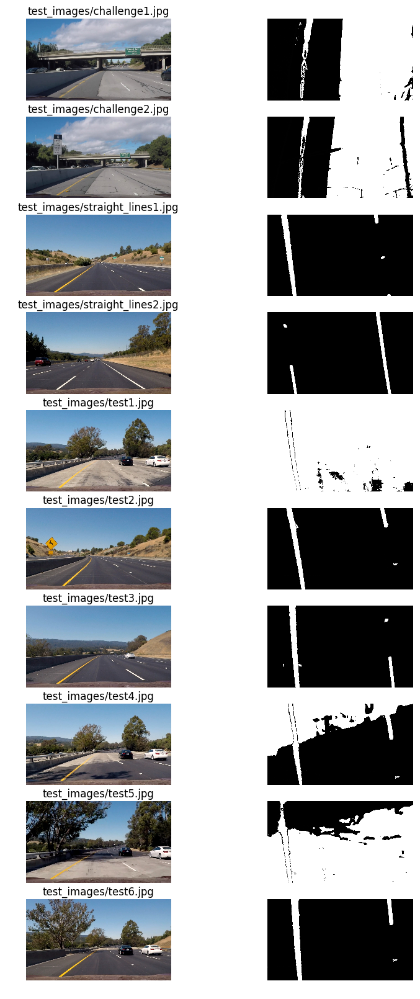

In [619]:
images = glob.glob('test_images/*.jpg')

f,axs = plt.subplots(len(images),2,figsize=(10,20))
f.subplots_adjust(hspace=0.2,wspace=0.01)

for i,IMG in enumerate(images):
    image = LoadImgAndCrop(IMG)
    bin_final,_ = pipeline(image)
    axs[i][0].imshow(image)
    axs[i][0].axis('off')
    axs[i][0].set_title('{}'.format(IMG))
    axs[i][1].imshow(bin_final,cmap='gray')
    axs[i][1].axis('off')
    

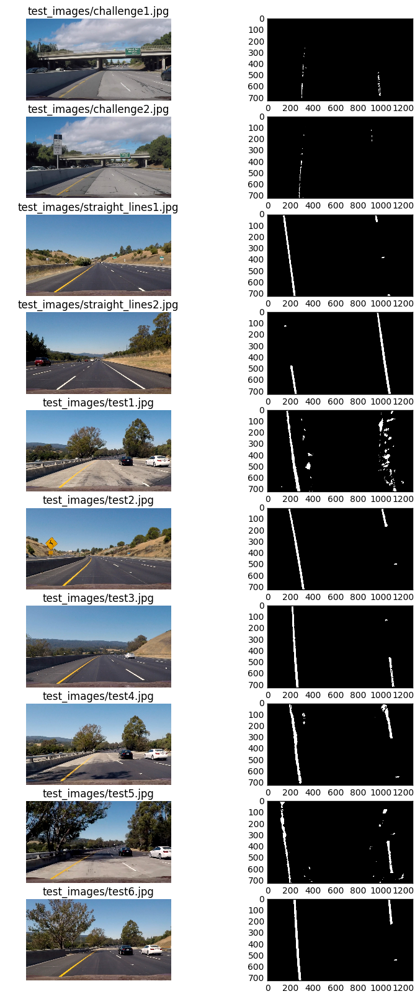

In [778]:
images = glob.glob('test_images/*.jpg')

f,axs = plt.subplots(len(images),2,figsize=(10,20))
f.subplots_adjust(hspace=0.2,wspace=0.01)

for i,IMG in enumerate(images):
    image = LoadImgAndCrop(IMG)
    bin_final,_ = pipeline2(image)
    axs[i][0].imshow(image)
    axs[i][0].axis('off')
    axs[i][0].set_title('{}'.format(IMG))
    axs[i][1].imshow(bin_final,cmap='gray')
    #axs[i][1].axis('off')



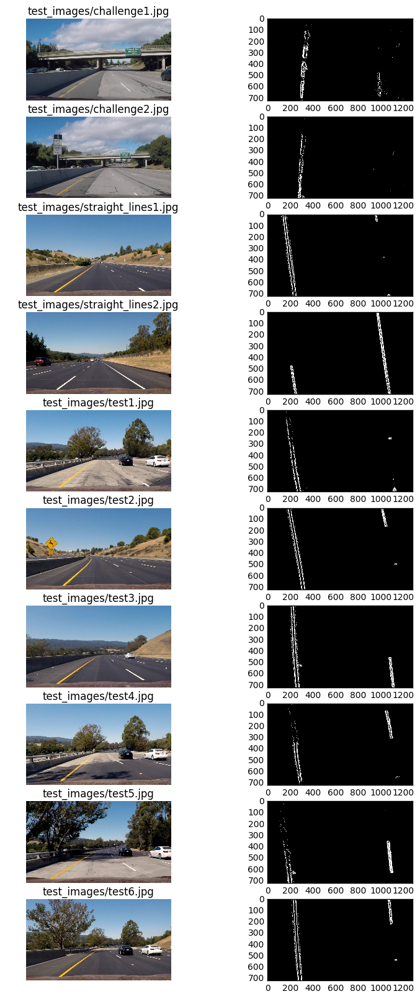

In [789]:
images = glob.glob('test_images/*.jpg')

f,axs = plt.subplots(len(images),2,figsize=(10,20))
f.subplots_adjust(hspace=0.2,wspace=0.01)

for i,IMG in enumerate(images):
    image = LoadImgAndCrop(IMG)
    bin_final,_ = pipeline3(image)
    axs[i][0].imshow(image)
    axs[i][0].axis('off')
    axs[i][0].set_title('{}'.format(IMG))
    axs[i][1].imshow(bin_final,cmap='gray')
    #axs[i][1].axis('off')

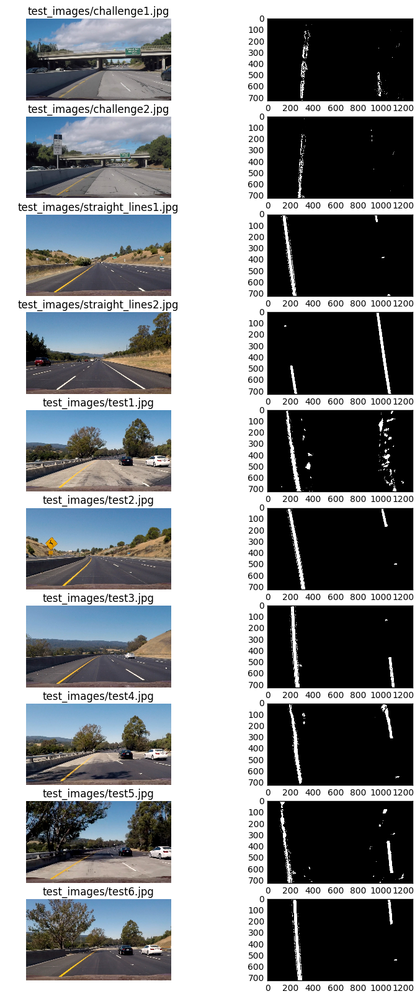

In [791]:
images = glob.glob('test_images/*.jpg')

f,axs = plt.subplots(len(images),2,figsize=(10,20))
f.subplots_adjust(hspace=0.2,wspace=0.01)

for i,IMG in enumerate(images):
    image = LoadImgAndCrop(IMG)
    bin_final3,_ = pipeline3(image)
    bin_final2,_ = pipeline2(image)
    bin_final = cv2.bitwise_or(bin_final2,bin_final3)
    axs[i][0].imshow(image)
    axs[i][0].axis('off')
    axs[i][0].set_title('{}'.format(IMG))
    axs[i][1].imshow(bin_final,cmap='gray')
    #axs[i][1].axis('off')

### Sliding Window technique to fit a Polynomial Line on the lane markings

In [639]:
def initial_polyfit(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    #quarterpoint = np.int(midpoint//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 5
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    left_rectangle = []
    right_rectangle = []
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        left_rectangle.append([(win_xleft_low,win_y_low),(win_xleft_high,win_y_high)])
        right_rectangle.append([(win_xright_low,win_y_low),(win_xright_high,win_y_high)])
        # Draw the windows on the visualization image
        #cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        #cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy > win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy > win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    #print('lenght of the left_lane_inds:{}'.format(len(left_lane_inds)))
    #print('length of the right_lane_inds:{}'.format(len(right_lane_inds)))
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    left_fit, right_fit = (None, None)
    
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) !=0:
        right_fit = np.polyfit(righty, rightx, 2)
    return left_fit,right_fit,left_lane_inds,right_lane_inds,left_rectangle,right_rectangle,histogram



In [640]:
def createVisual_polyfit_frame(binary_warped,
                               left_fit,right_fit,
                               left_lane_inds,right_lane_inds,
                               left_rectangle,right_rectangle):
    """
    binary_warped: output of pipeline(img)
    left_fit,right_fit,left_lane_inds,right_lane_inds: output of initial_polyfit()
    """
    # Create an output image to draw on and  visualize the result
    out_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped))*255)
    #out_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped)))
    print(out_img.shape)
    plt.imshow(out_img,cmap='gray')
    plt.show()
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    for l_rect,r_rect in zip(left_rectangle,right_rectangle):
        cv2.rectangle(out_img,l_rect[0],l_rect[1],(0,255,0), 2)
        cv2.rectangle(out_img,r_rect[0],r_rect[1],(0,255,0), 2)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0,binary_warped.shape[1])
    plt.ylim(binary_warped.shape[0],0)
    

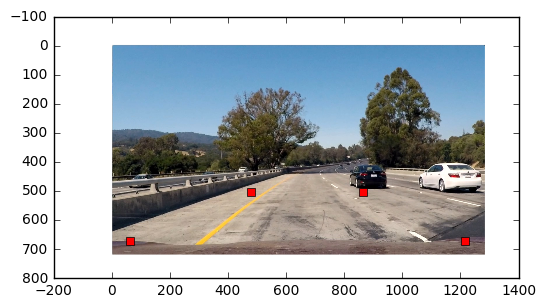

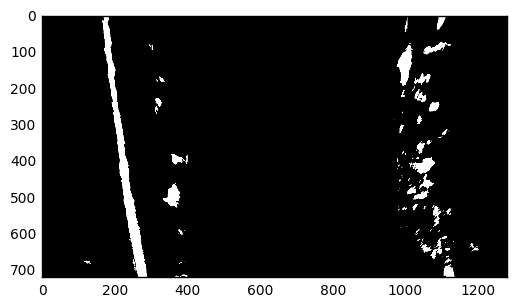

(720, 1280, 3)


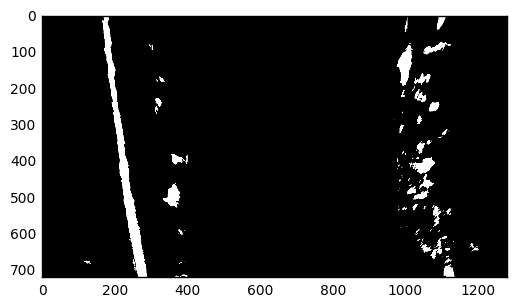

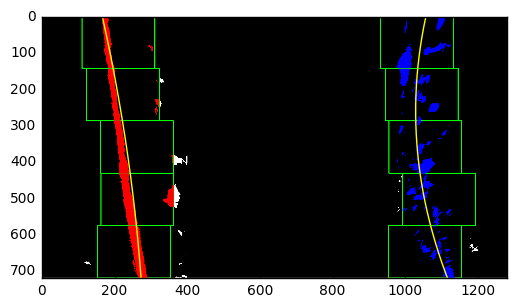

In [786]:
exImg = LoadImgAndCrop('test_images/test1.jpg')

#exImg = LoadImgAndCrop('test_images/straight_lines2.jpg')
plt.imshow(exImg)
for i in range(4):
    plt.plot(src[i][0],src[i][1],'rs')
plt.show()
bin_warped,Minv = pipeline2(exImg)
plt.imshow(bin_warped,cmap='gray')
plt.show()



left_fit,right_fit,left_lane_inds,right_lane_inds,left_rectangle,right_rectangle,histogram \
= initial_polyfit(binary_warped=bin_warped)

createVisual_polyfit_frame(bin_warped,left_fit,right_fit,left_lane_inds,right_lane_inds,
                          left_rectangle,right_rectangle)



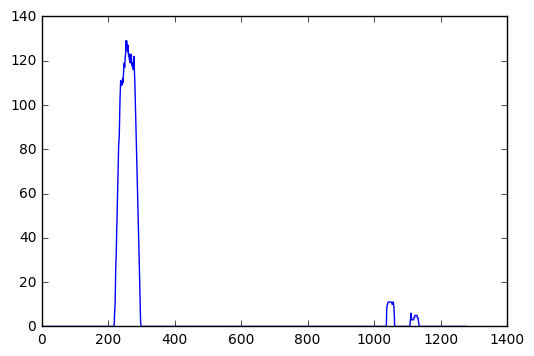

In [781]:
plt.plot(histogram)


### Polyfit Using Previous Frame

In [643]:
def previous_polyfit(binary_warped,left_fit_prev,right_fit_prev):
    """
    binary_warped: the image output of pipeline()
    left_fit_prev: left_fit from the previous frame (output of initail_polyfit)
    right_fit_prev: right_fit from the previous frame (output of the inital polyfit)
    """
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit_new = np.polyfit(lefty, leftx, 2)
    right_fit_new = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
#     ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#     left_fitx = left_fit_new[0]*ploty**2 + left_fit_new[1]*ploty + left_fit_new[2]
#     right_fitx = right_fit_new[0]*ploty**2 + right_fit_new[1]*ploty + right_fit_new[2]
    return left_fitx, right_fitx,left_lane_inds,right_lane_inds

(720, 0)

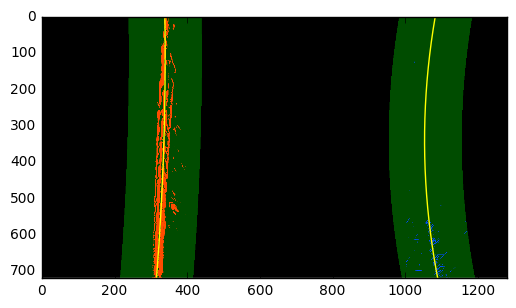

In [644]:
exImg = plt.imread('FrameCaptureFromChalleng4video/frame1.jpg')
bin_warped,Minv = pipeline3(exImg)
margin = 100

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = previous_polyfit(bin_warped,left_fit,right_fit)

ploty=np.linspace(0,bin_warped.shape[0]-1,bin_warped.shape[0])
left_fitx=left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2+right_fit[1]*ploty + right_fit[2]

left_fitx2 = left_fit2[0]*ploty**2+ left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2+right_fit2[1]*ploty + right_fit2[2]

out_img = np.dstack((bin_warped, bin_warped, bin_warped))
window_img = np.zeros_like(out_img)

nonzero = bin_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])


# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, bin_warped.shape[1])
plt.ylim(bin_warped.shape[0], 0)

### Radius of Curvature and Distance from Lane Center

In [645]:
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

In [680]:
exImg = LoadImgAndCrop('test_images/test1.jpg')
binImg,_ = pipeline3(exImg)
left_fit,right_fit,left_lane_inds,right_lane_inds,left_rectangle,right_rectangle,histogram = initial_polyfit(binImg)

rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(bin_warped, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')

Radius of curvature for example: 1675.81891239 m, 868.019157215 m
Distance from lane center for example: -0.570801456047 m


### Draw the Lanes on the original image

In [739]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,0), thickness=50)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,0,255), thickness=50)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

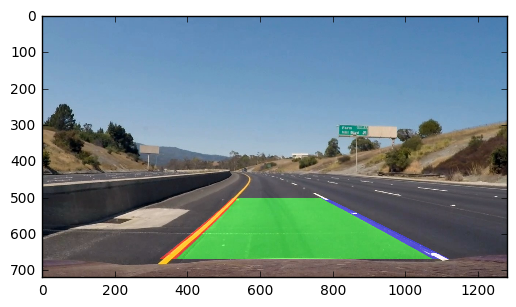

In [800]:
exImg = LoadImgAndCrop('project_video_frames/frame18.jpg')
binImg3,_ = pipeline3(exImg)
binImg2,_ = pipeline2(exImg)
binImg = cv2.bitwise_or(binImg2,binImg3)
left_fit,right_fit,left_lane_inds,right_lane_inds,left_rectangle,right_rectangle,histogram = initial_polyfit(binImg)

#createVisual_polyfit_frame(binImg,left_fit,right_fit,left_lane_inds,right_lane_inds,
#                          left_rectangle,right_rectangle)
plt.imshow(draw_lane(exImg, binImg, left_fit,right_fit,Minv))

### Draw Radius of Curvature and Distance from Center of Lane on the Original Image

In [656]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Radius of Curvature: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

Radius of curvature for example: 1376.56049775 m, 117.139083784 m
Distance from lane center for example: -0.561110326783 m


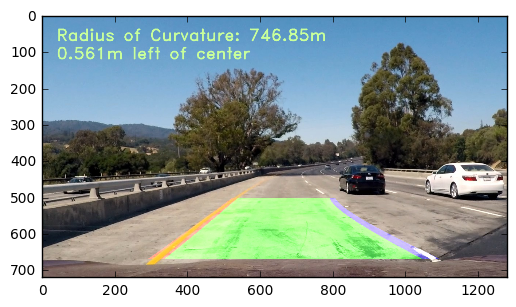

In [801]:
exImg = LoadImgAndCrop('test_images/test1.jpg')
binImg3,Minv = pipeline3(exImg)
binImg2,_ = pipeline2(exImg)
binImg = cv2.bitwise_or(binImg2,binImg3)

# binImg,Minv = pipeline3(exImg)
left_fit,right_fit,left_lane_inds,right_lane_inds,left_rectangle,right_rectangle,histogram = initial_polyfit(binImg)

rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(binImg, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')
exImg_out = draw_lane(exImg, binImg, left_fit,right_fit,Minv)
exImg_out2 = draw_data(exImg_out,(rad_l+rad_r)/2, d_center)
plt.imshow(exImg_out2)

### Define a Class for Storing Data

In [651]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)



## Complete Image Pipeline

In [652]:
def complete_pipeline(img):
    new_img = np.copy(img)
    img_bin, Minv = pipeline3(new_img)
    
    if not l_line.detected or not r_line.detected:
        l_fit,r_fit,l_lane_inds,r_lane_inds,_,_,_ = initial_polyfit(img_bin)
    else:
        l_fit,r_fit,l_lane_inds,r_lane_inds = previous_polyfit(img_bin,l_line.best_fit,r_line.best_fit)
        
        
    if l_fit is not None and r_fit is not None:
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        
        x_int_diff = abs(r_fit_x_int - l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit,l_lane_inds)
    r_line.add_fit(r_fit,r_lane_inds)
    
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit,Minv)
        rad_l,rad_r,d_center = calc_curv_rad_and_center_dist(img_bin, l_line.best_fit,r_line.best_fit,l_lane_inds,r_lane_inds)
        img_out = draw_data(img_out1,(rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img 
        
    return img_out

In [804]:

def complete_pipeline2(img):
#     global prev
#     global l_fit_prev
#     global r_fit_prev
#     global l_lane_inds_prev
#     global r_lane_inds_prev
    
    img_bin2,_ = pipeline2(img)
    img_bin3, Minv = pipeline3(img)
    img_bin = cv2.bitwise_or(img_bin2,img_bin3)
    
#     if prev == 0:
#         print(prev)
#         l_fit,r_fit,l_lane_inds,r_lane_inds,_,_,_ = initial_polyfit(img_bin)
#         prev = 1
#         l_fit_prev,r_fit_prev, l_lane_inds_prev,r_lane_inds_prev = l_fit,r_fit,l_lane_inds,r_lane_inds
#     else:
#         l_fit,r_fit,l_lane_inds,r_lane_inds = previous_polyfit(img_bin,l_fit_prev,r_fit_prev)
#         l_fit_prev,r_fit_prev, l_lane_inds_prev,r_lane_inds_prev = l_fit,r_fit,l_lane_inds,r_lane_inds
    
    l_fit,r_fit,l_lane_inds,r_lane_inds,_,_,_ = initial_polyfit(img_bin)
    img_out1 =  draw_lane(img, img_bin, l_fit,r_fit,Minv)
    rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(img_bin, 
                                                           l_fit, 
                                                           r_fit, 
                                                           l_lane_inds, 
                                                           r_lane_inds)
    img_out = draw_data(img_out1,(rad_l+rad_r)/2, d_center)
    return img_out


### Process Project Video

In [638]:
import imageio
imageio.plugins.ffmpeg.download()

In [805]:
# l_line = Line()
# r_line = Line()

prev = 0 #set as global variable

video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')

processed_video = video_input1.fl_image(complete_pipeline2)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [03:04<00:00,  6.88it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 4min 22s, sys: 38.8 s, total: 5min 1s
Wall time: 3min 4s
